## Mapping
The first step to display data on the cerebellar surface is to map it to the flatmap. 

In [ ]:
# Import the Suit package
import SUITPy.flatmap as flatmap
import matplotlib.pyplot as plt
import nibabel as nb
import numpy as np
import nitools as nt


The following command maps an example functional volume (``MDTB08_Math.nii``) to the surface. The volume is a group-averaged map in SUIT-space. The mapped data is returned as a numpy array.

In [2]:
funcdata = flatmap.vol_to_surf('MDTB08_Math.nii')
print('Output is a np.array of size:',funcdata.shape)

Output is a np.array of size: (28935, 1)


The function takes either a filename, a list of filenames, or a list of nibable.NiftiImage to be mapped.

### Atlas space
By default, the function assumes that the data is mapped to SUIT space. You can specify the normalization space with the optional input argument `space`. Options are:

- ``SUIT``: SUIT space
- ``FSL``: FNIRT alignment to FSL standard (``MNI152NLinAsym6``)
- ``SPM``: Segmentation/Normalization option in SPM 
- ``MNISym``: Alignment to ``MNI152NLin2009cSym``   
- ``MNI``: Alignment to ``MNI152NLinAsym6`` (same as FSL)

In [3]:
# Signals the function that the volume was mapped to SUIT space (default):
funcdata = flatmap.vol_to_surf('MDTB08_Math.nii',space='SUIT')

### Mapping ROI labels 
By default the function `vol_to_surf` assumes that the data is continuous functional data. It therefore averages the data across voxels at a specific location of the map. If you want to map a segmentation volume that contains discrete labels, you can specify to use the mode, rather than the mean. 

In [4]:
vol = 'Buckner_17Networks.nii'
labeldata = flatmap.vol_to_surf(vol,stats = 'mode')

### Mapping many volumes 
You can also map a whole set of volumes by passing a list to `vol_to_surf`. This will be faster than mapping all volumes seperately. 


In [5]:
vols = ['Buckner_7Networks.nii','Buckner_17Networks.nii']
labeldata = flatmap.vol_to_surf(vols,stats = 'mode')
print('Output is a np.array of size:',labeldata.shape)

Output is a np.array of size: (28935, 2)


### Saving data as a gifti file 
If you want to save the mapped data as a gifti file, you can create a corresponding GIFTI image using nitools (neuroimaging tools) and save it to disk using nibabel. 

In [6]:
funcdata = flatmap.vol_to_surf('MDTB08_Math.nii',space='SUIT')
# Make gifti image with the right column names
funcgifti  = nt.make_func_gifti(funcdata,column_names=['Math'])
# You can also make a label gifti:
labelgifti = nt.make_label_gifti(labeldata)
nb.save(funcgifti,'MDTB08_Math.func.gii')

## Plotting

### Choosing a renderer (Matplotlib or Plotly)
SUITPy uses either `matplotlib` or `plotly` for rendering. `matplotlib` is slower, but allows the use of the familiar Matplotlib environment to generate subplot and to set figure sizes. `plotly` renders the figure through WebGL, allowing the figures to be viewed in a web-browser. For subplot control or additions to the plot, familiarity with [plotly](https://plotly.com/python/getting-started/) is required. The renderer is set through the optional input parameter `render`. 

### Plotting of functional overlays
The functional data that we just mapped can be plotted with the functional `flatmap.plot`.  The main input argument can be a np-array with the data to plot, a gifti image object, or the name of a gifti file to load. 
The scaling can be set with the `csale` parameter.
A threshold are set with `threshold` - only values above this threshold will be plotted.

For full funtion reference see the function reference for the flatmap module. 

<AxesSubplot:>

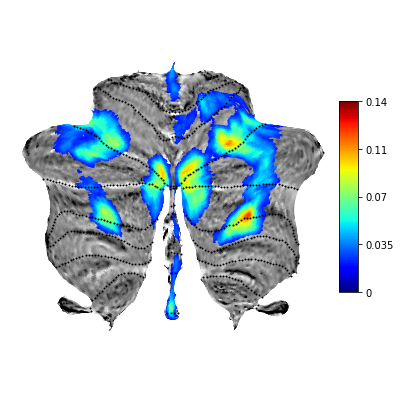

In [7]:
flatmap.plot(data=funcdata, cmap='jet', \
    cscale = [0,0.14], \
    threshold=0.02, \
    new_figure=True, \
    colorbar=True, \
    render='matplotlib')

### Plotting both activations and deactivations
For plotting activations and deactivations in the same plot, use a divergent colormap such as 'bwr' or 'coolwarm', and set the cscale paramter to something symmetric (e.g. [-0.5.0.5])
More neuroimaging colormap can be found in nilearn.

If you want to threshold the data, set the parameter to a list [-negative_threshold, positive_threshold].

<AxesSubplot:>

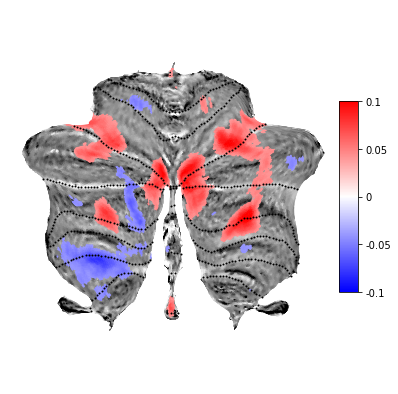

In [8]:
flatmap.plot(data=funcdata, cmap='bwr', \
    cscale = [-0.1,0.1], \
    threshold= [-0.04,0.04], \
    new_figure=True, \
    colorbar=True, \
    render='matplotlib')

### Plotting Label data
For label (categorical) data choose `overlay_type = 'label'` and set the colormap to a qualitative (categorical) color map.

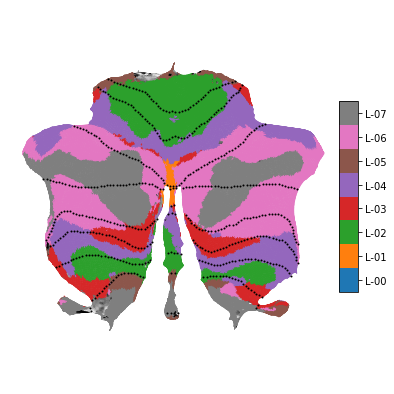

In [9]:
ax = flatmap.plot(labeldata, \
                  overlay_type='label', \
                  cmap='tab10', \
                  colorbar=True, \
                  render='matplotlib')

### Plotting RGB(A) data
For full control of how the flatmap looks like, one can also specify the RGB(A) value for each node. 
One common example is where one shows the overlap between 2 or 3 different contrast, assigning each contrast to a separate color channel. 
RGB-values need to be 0.0-1.0, and the data needs to have either 3 (RGB) or 4 (RGBA) columns. 
Set `overlay_type = 'rgb'`, any color map does not have any influence

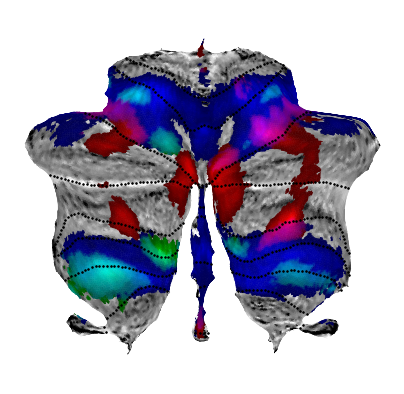

In [10]:
fname = ['MDTB08_Math.func.gii',
         'MDTB04_Action_Observation.func.gii',
         'MDTB16_Finger_Sequence.func.gii']


# Read files and put each on a separate color channel
nvert = 28935
data = np.zeros((nvert,4))
for i,f in enumerate(fname):
  A = nb.load(f)
  data[:,i]=np.nan_to_num(A.darrays[0].data)
  # Scale to have the maximum a 1
  data[:,i]=data[:,i]/np.max(data[:,i])
  # Remove data below threshold
  data[data[:,i]<0.3,i]=0
# Set below-threshold areas to nan (transparent)
data[data[:,0:3].sum(axis=1)==0]=np.nan
data[:,3]=1
ax = flatmap.plot(data,overlay_type='rgb',
                  bordersize=3,
                  bordercolor='k',
                  backgroundcolor='w',
                  render='matplotlib')

### Colorbars (Matplotlib) and Hover information (Plotly)
For Matplotlib, the color bar can be switched on and off by setting `colorbar` to `True` or `False`. For Plotly, the color bar option is not yet implemented, but if you can hover your mouse over the the map to get the value. The format of the hover information is dictated by `hoverinfo`, which can be `"auto"`, `"value"`, or `None`. The Numberformat for colorbar and hover information can be set with `cbar_tick_format`. 

In [11]:
# And the same plot, rendered with Plotly:
flatmap.plot(data=funcdata, cmap='jet', \
    threshold=0.01, \
    render='plotly',\
    cbar_tick_format='%.3f',\
    hover='auto')

### Plotting directly from a gifti file
You can also plot directly from a gifti file. When you choose 'label', `suit.flatmap.plot` will also extract the color map from the label.gii file and use it. 

<AxesSubplot:>

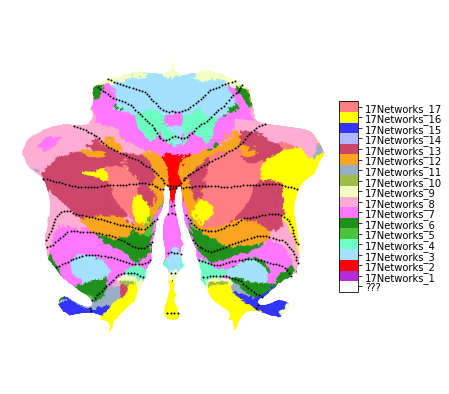

In [12]:
flatmap.plot('Buckner_17Networks.label.gii',\
    overlay_type='label',\
    new_figure=True, \
    colorbar=True)

### Combining flatmaps in subplots (Matplotlib only)
By default, `flatmap.plot` renders the flatmap into the current axis of matplotlib. This enables the user to combine combine different flatmaps in one figure using different subplots. 

<AxesSubplot:>

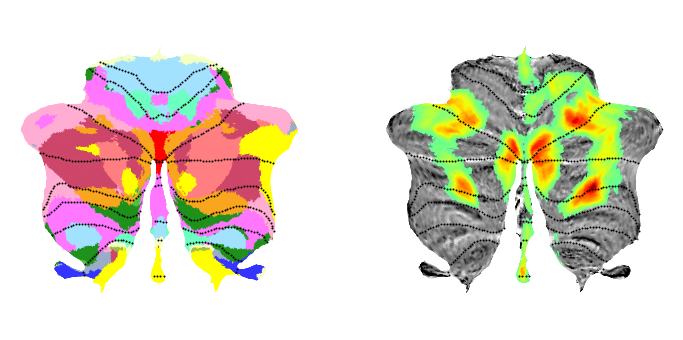

In [13]:
fig = plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
flatmap.plot('Buckner_17Networks.label.gii',overlay_type='label',new_figure=False)
plt.subplot(1,2,2)
flatmap.plot(data=funcdata, cmap='jet', threshold=0.01,new_figure=False)


### Adjusting style and color of the borders
By setting the optional parameters `bordersize` and `bordercolor`, and `backgroundcolor` you can modify the appearance of the (lobular) boundaries and the figure background to generate graphs that work well on black background. 


<AxesSubplot:>

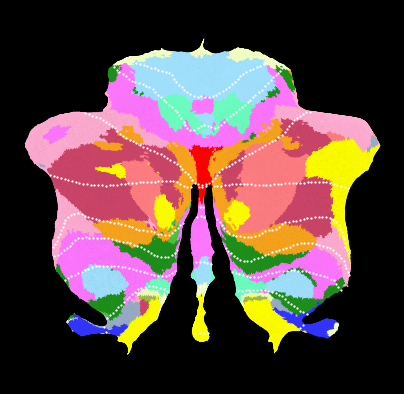

In [14]:
flatmap.plot('Buckner_17Networks.label.gii',\
    overlay_type='label',\
    bordersize=2.5, \
    bordercolor='w',\
    backgroundcolor='k',\
    render='matplotlib')